# Proyecto: El Desafío de Don Rene

**MDS7202: Laboratorio de Programación Científica para Ciencia de Datos**

### Cuerpo Docente:

- Profesores: Matías Rojas - Mauricio Araneda
- Auxiliar: Ignacio Meza D.
- Ayudante: Rodrigo Guerra

*Por favor, lean detalladamente las instrucciones de la tarea antes de empezar a escribir.*


----

## Reglas

- Fecha de entrega: 13/12/2022 (Sin atrasos)
- **Grupos de 2 personas.**
- Cualquier duda fuera del horario de clases al foro. Mensajes al equipo docente serán respondidos por este medio.
- Estrictamente prohibida la copia. 
- Pueden usar cualquier material del curso que estimen conveniente.


---

## El desafio de Don Rene


Don Rene, afamado *influencer* y próximo emprendedor de IA, decide que será una buena idea darle un giro a su vida y dedicarse al rubro del asesoramiento de inversionistas en la industria de los videojuegos. 

El futuro empresario plantea que el éxito relativo de una inversión en una desarrolladora de juegos debe ser analizado desde un punto de vista basado en evidencia y no en la intuición. 
Por dicha razón, plantea que para el sería ideal que existiera una máquina que, dada las características de un nuevo videojuego (su género, el estudio que lo desarrolla, su historia, etc...), indique si este será potencialmente una inversión rentable o no.

Rene está convencido que el éxito de una inversión en videojuegos estar relacionada por dos características muy relevantes de estos una vez que salen al mercado:

**1. La potencial evaluación (Positivo, Negativo, etc...) que le den los usuarios que jugarán el juego.**

**2. Las potenciales ventas del juego.**

Si bien la idea puede sonar excelente, Don Rene carece en su totalidad de una formación en Ciencia de los Datos, por lo que decide ir en ayuda de expertos para implementar su idea.

Sin embargo, como fiel discipulo del libre mercado, decide no contratar a un equipo en particular, si no que tener la libertad de elegir entre muchos equipos que compiten entre si para saber cuál contratar. Para esto recurre a una triquiñuela recurrentemente utilizada en data science: Establecer una competencia abierta y contratar a los que cumplan mejor sus requisitos.


Para esto, Don Rene abre una competencia en la plataforma Codalab (plataforma similar a Kaggle) la cuál, espera que se replete de buenas propuestas. Los equipos que mejor evaluaciones obtengan (los primeros 5 de cada tabla) serán contratados y retribuidos con un cupón canjeable con la friolera cantidad de 1 punto bonus para el proyecto en el curso MDS7202.





### Definición Formal del Problema

El objetivo de este proyecto es relativamente sencillo, pero en extremo ambicioso: Tendrán que aplicar todo lo aprendido hasta este momento con el fin de solucionar 2 problemas distintos: 

1. **Clasificación de potenciales evaluaciones con las que los jugadores evaluarán los juegos**. Las posibles clases que deben asignar a cada juego son `('Negative', 'Mixed', 'Mostly Positive', 'Positive', 'Very Positive')`. La métrica de evaluación utilizada para medir la clasificación es `f1_weighted`.
2. **Regresión de las potenciales ventas que tendrán los juegos**. La métrica de evaluación utilizada para medir la clasificación es `r_2`.

Para esto, ustedes contarán un dataset que cuenta con diversa información de los juegos de la plataforma Steam (tales como fecha de lanzamiento, logros disponibles, plataforma, desarrollador, distribuidor, tags, etc...) más las etiquetas y valores a predecir.


El objetivo final es que participen en la competencia generada en Codalab. Una competencia de Data Science funciona generalmente de la siguiente manera: 

1. Se plantea un problema que los equipos deben resolver.
2. Se provee de datos de entrenamiento a los equipos para que generen modelos que resuelvan el problema.
3. Se provee de datos de prueba que los equipos deberán predecir con los modelos creados. Una vez predichos, los equipos deben subir los archivos a la plataforma, la cuál los evaluará y publicará en un tablero disponible para todos los participantes.

Por este motivo, se les provee de dos datasets: `train.pickle` y `test.pickle`.

- Por una parte, `train.pickle` está preparado que lo utilizen como conjunto de entrenamiento del modelo; por lo que incluye las etiquetas y valores por predecir. 

- Por otra parte, la evaluación de la competencia será hecha usando `test.pickle`. Es decir, este dataset solo contiene características de los juegos y ustedes deberán predecir tanto las potenciales evaluaciones como las posibles ventas de estos y subir sus resultados.

- Además, tendrán sample subissions, es decir, un ejemplo de como subir las evaluaciones.

Obviamente para subir archivos a la competencia deberán registrarse en Codalab. **Puden participar máximo 5 veces en la competencia** (la idea es evitar que se sobreajusten a los datos que deben predecir)

**IMPORTANTE**: Para la clasificación no usen la cantidad de ventas (target de la regresión) como atributo. Por otro lado, para la regresión no utilicen las evaluaciones como atributo para predecir. Infringir estas reglas implicará en no contar el puntaje de la competencia como tampoco poder participar de los bonus por los tops.




# Proyecto

### Equipo:

- Camilo Carvajal Reyes
- Andrés González Fuentes

- \<Nombre de usuarios en Codalab\>

- \<Nombre del Equipo en Codalab\>

### Link de repositorio de GitHub: `https://github.com/camilocarvajalreyes/laboratorios-MDS7202`




## 1. Introducción

El objetivo de este proyecto consiste en ...

Los datos que proveen es un dataset con X ejemplos que describen una observación de ... 
Son N atributos y la variables objetivos son de tipo ... y ...

La primera tarea se evalua en base a la métrica ... ya que esta permite medir ...

Nuestra propuesta para resolver el problema consistieron en modelo basado en...

Nuestro modelo cumplió/no cumplió las expectativas...

---
## 2. Análisis Exploratorio de Datos

### Librerías

In [1]:
%load_ext autoreload
%autoreload 2

import pickle
import re
import sys
import os
from tempfile import mkdtemp

project_path = os.path.abspath('..')
sys.path.insert(1, project_path)

from src.eda.plots import plot_correlations, df_numeric_histograms, n_best_rating, boxplot_col_rating_english
from src.eda.text import plot_token_frequency, most_common, wordcloud_from_column

import numpy as np
import pandas as pd

from plotly.offline import download_plotlyjs, init_notebook_mode,  iplot
init_notebook_mode(connected=True)

import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')

import plotly.graph_objects as go
import plotly.express as px

from nltk.corpus import stopwords


from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.model_selection import train_test_split 
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import FunctionTransformer
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import MinMaxScaler, PowerTransformer


### Carga de datos

In [76]:
data = pd.read_pickle('../data/raw/train.pickle')
data.head()

,name,release_date,english,developer,publisher,platforms,required_age,categories,genres,tags,achievements,average_playtime,price,short_description,estimated_sells,rating
0,An Aspie Life,2018-03-29,1,Bradley Hennessey;Joe Watson,EnderLost Studios,windows,0,Single-player;Steam Achievements,Adventure;Casual;Free to Play;Indie;Simulation,Free to Play;Adventure;Indie,23,0,0.00,One day your roommate Leaves for no reason. Yo...,3914,Mixed
1,GhostControl Inc.,2014-06-06,1,bumblebee,Application Systems Heidelberg,windows;mac;linux,0,Single-player;Steam Achievements;Steam Trading...,Casual;Indie;Simulation;Strategy,Turn-Based;Indie;Simulation,53,65,10.99,Manage a team of ghosthunters and free London ...,10728,Mixed
2,Deponia,2012-08-06,1,Daedalic Entertainment,Daedalic Entertainment,windows;mac;linux,0,Single-player;Steam Achievements;Steam Trading...,Adventure;Indie,Adventure;Point & Click;Comedy,19,217,6.99,"In Deponia, the world has degenerated into a v...",635792,Positive
3,Atlas Reactor,2016-10-04,1,Trion Worlds,Trion Worlds,windows,0,Multi-player;Online Multi-Player;Steam Achieve...,Free to Play;Strategy,Free to Play;Multiplayer;Strategy,121,1240,0.00,SEASON 6 NOW LIVE! The battle for Atlas contin...,253864,Positive
4,CHUCHEL,2018-03-07,1,Amanita Design,Amanita Design,windows;mac,0,Single-player;Steam Achievements;Steam Trading...,Adventure;Casual;Indie,Adventure;Indie;Casual,7,245,7.99,CHUCHEL is a comedy adventure game from the cr...,49818,Mostly Positive


In [9]:
def custom_features(dataframe_in):
    df = dataframe_in.copy(deep=True)

    df['month'] = pd.to_datetime(df['release_date']).dt.month
    df['release_date'] = pd.to_datetime(df['release_date']).apply(lambda x: x.to_julian_date())
    df['revenue'] = 0

    top_pub_revenues = {'microsoft':10.260, 'netease':6.668, 'activision':6.388, 'electronic':5.537, 'bandai':3.018, 'square':2.386, 'nexon':2.286,
                        'ubisoft':1.446, 'konami':1.303, 'SEGA':1.153, 'capcom':0.7673, 'warner':0.7324}

    for rev_tuples in top_pub_revenues.items():
        pub, rev = rev_tuples
        if pub == 'SEGA':
            df.loc[df.publisher.str.match(f'.*{pub}.*').values, 'revenue'] = rev
        else:
            df.loc[df.publisher.str.match(f'.*{pub}.*', flags=re.IGNORECASE).values, 'revenue'] = rev    
    return df

In [15]:
df = custom_features(data)

In [16]:
separate = lambda string: np.array(string.split(';'),dtype=object)

df.replace({'rating':{'Negative':1, 'Mixed':2, 'Mostly Positive':3, 'Positive':4, 'Very Positive':5}}, inplace=True)
df = df.astype({'rating': float})
df.loc[:, 'publisher'] = df['publisher'].apply(separate)

In [27]:
df_ratings = df\
                .explode('publisher')\
                .groupby(['publisher'])\
                .agg(
                    rating_promedio=('rating',np.mean),
                    n_juegos=('name','count'),
                    tiempo_de_juego_total=('average_playtime','sum'),
                    total_de_ventas=('estimated_sells','sum'),
                    rev=('revenue','first'))\
                .sort_values(
                    'rating_promedio',
                    ascending=False)

In [39]:
100 * 90/data.shape[0]

1.1419870574800153

In [40]:
df.explode('publisher').loc[df.explode('publisher').revenue > 0].groupby('publisher').agg(n_juegos=('name','count'),rev=('revenue','first'),total_de_ventas=('estimated_sells','sum')).sort_values('n_juegos', ascending=False)

,n_juegos,rev,total_de_ventas
publisher,,,
Ubisoft,95,1.4460,63595357
Square Enix,90,2.3860,41132877
SEGA,74,1.1530,31751391
BANDAI NAMCO Entertainment,55,3.0180,20465981
Electronic Arts,30,5.5370,14903429
Capcom,30,0.7673,11032485
Activision,28,6.3880,16897602
Feral Interactive (Mac),28,2.3860,34828614
Warner Bros. Interactive Entertainment,27,0.7324,16656421


In [35]:
df_ratings.sort_values('n_juegos', ascending=False).head(50)#.loc[df_ratings.sort_values('rev', ascending=False).rev > 0]

,rating_promedio,n_juegos,tiempo_de_juego_total,total_de_ventas,rev
publisher,,,,,
Ubisoft,3.052632,95,99688,63595357,1.4460
Square Enix,3.066667,90,124992,41132877,2.3860
THQ Nordic,2.741176,85,17487,6850311,0.0000
SEGA,3.662162,74,76264,31751391,1.1530
Devolver Digital,3.863636,66,15319,19957337,0.0000
BANDAI NAMCO Entertainment,3.054545,55,66841,20465981,3.0180
Sekai Project,4.388889,54,15093,4986916,0.0000
1C Entertainment,2.725490,51,10511,3026851,0.0000
2K,2.840000,50,36268,40898892,0.0000


### Conteo de variables

In [15]:
counts = pd.concat([data.count(), data.nunique(), data.isna().sum(), data.dtypes], axis=1)
counts.columns = ['Conteo de valores', 'Conteo de valores únicos', 'Conteo de NaNs', 'Tipos de datos']
counts.index.name = 'Columnas'

# Solo para guardar como .png la tabla
# import dataframe_image as dfi
# dfi.export(counts, 'tabla_de_conteo.png')'

<center><img src="../figures/tabla_de_datos.png"/></center>

### Columnas con valores numéricos

#### Distribución

In [117]:
df_numeric_histograms(data)

#### Correlaciones

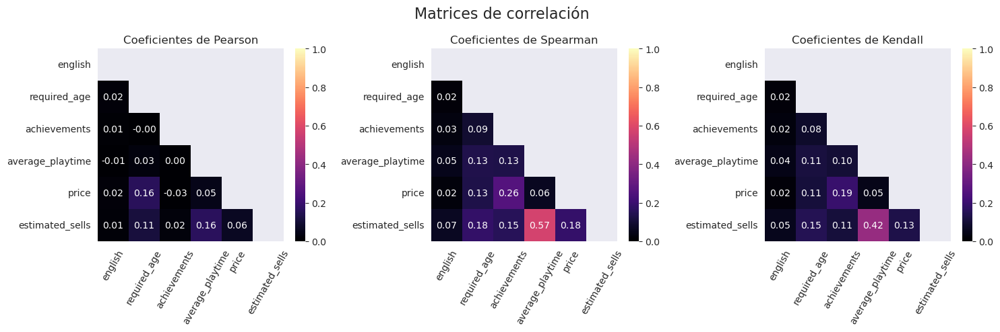

In [5]:
plot_correlations(data, ['pearson', 'spearman', 'kendall'])

#### Scatter matrix

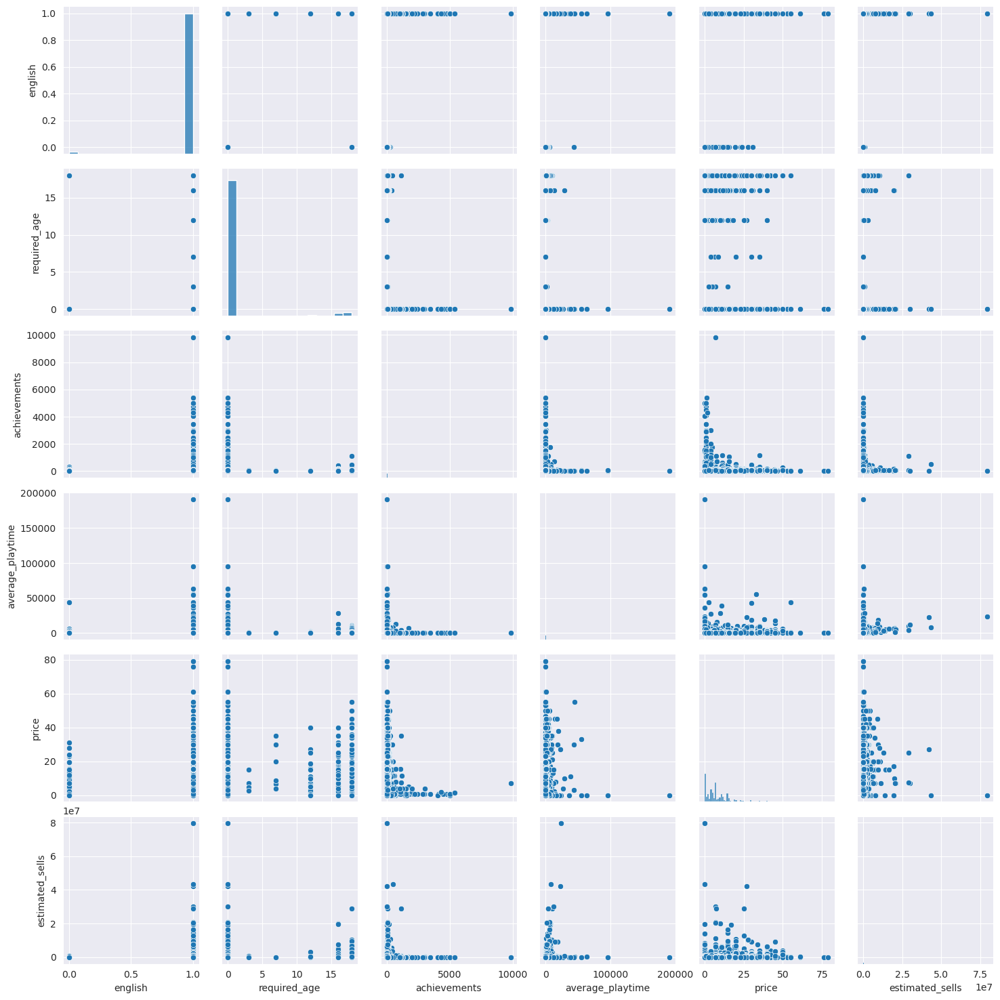

In [6]:
sns.pairplot(data.select_dtypes(np.number))
plt.show()

#### Boxplots ratings

In [125]:
boxplot_col_rating_english(data)

#### Categorías más comunes

In [11]:
cat_cols = ['developer', 'publisher', 'categories', 'platforms', 'genres', 'tags']

for col in cat_cols:
    n_best_rating(data, col)

In [3]:
def categorias(df,columna,counts=True,return_df=True):
    separate = lambda string: np.array(string.split(';'),dtype=object)
    options = np.vectorize(separate)(df[columna])
    values, freqs = np.unique(np.concatenate(options),return_counts=counts)
    if not return_df:
        return values, freqs
    else:
        total = df.shape[0]

        dff = pd.DataFrame(index=values)
        dff['frecuencia'] = freqs
        dff['porcentaje'] = 100 * freqs / total
        return dff.sort_values('frecuencia',ascending=False)

In [4]:
cat_cols = ['developer', 'publisher', 'categories', 'platforms', 'genres', 'tags']

fig = go.Figure()

fig_buttons = []
df_freq_list = [categorias(data, col) for col in cat_cols]

default_state = 'developer'

for idx, df_freq in enumerate(df_freq_list):
        # df_plot=df.loc[df['english']==english].copy()


        fig.add_trace(go.Scatter(x=df_freq.index, y=df_freq['frecuencia'], name='Frecuencia', visible=(cat_cols[idx]==default_state)))
        fig.add_trace(go.Scatter(x=df_freq.index, y=df_freq['porcentaje'], name='Porcentaje', visible=(cat_cols[idx]==default_state)))
        # fig.update_xaxes(categoryorder='array', categoryarray= ['Negative', 'Mixed', 'Positive', 'Mostly Positive', 'Very Positive'])
        # fig.update_layout(legend_title_text='English')
        fig_buttons.append(dict(method='update',
                                label=cat_cols[idx],
                                args = [{'visible': [cat_cols[idx]==r for r in cat_cols for i in range(2)]},
                                        {'title':f'Boxplot de "{cat_cols[idx]}" según rating y disponibilidad en inglés'}]))

fig.update_layout(
        updatemenus=[
            dict(
                direction='down',
                showactive=True,
                # x=2,
                # y=2,
                buttons=list(fig_buttons)
                )],
        annotations=[
            dict(text='y-scale', x=-0.18, xref='paper', y=0.8, yref='paper', align='left', showarrow=False)
        ]
        )

# print("plataforms")
# df_freq = categorias(df_train,'platforms')
# print('largo = {}'.format(len(df_freq)))
# df_freq.plot()
# df_freq.head()
fig.show()

In [5]:
from sklearn.feature_extraction.text import CountVectorizer

bow = CountVectorizer(tokenizer= CategoriesTokenizer())
df = bow.fit_transform(docs)

pd.DataFrame(df.toarray(), columns=bow.get_feature_names_out())

NameError: name 'CategoriesTokenizer' is not defined

In [ ]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import MinMaxScaler

bog = CountVectorizer(
    tokenizer = CategoriesTokenizer(),
    min_df = 0.1  # hiperparametro a optimizar
    )

preprocessing = ColumnTransformer(
    transformers=[
        ('bag-of-categories',bog,['platforms','categories','genres','tags']),
        ('minmax',MinMaxScaler(),['...'])
    ]
)

## Exploración de variable de texto

In [57]:
def plot_token_frequency2(data, n_grams_list, title):
    serie_tokens = most_common(
        data,
        'short_description',
        ignore=stopwords.words('english'),
        n_grams=n_grams_list[0],
        limit=100)

    fig = px.bar(
                x=serie_tokens,
                y=serie_tokens.index,
                height=600,
                # color='Rating promedio',
                range_color=(1,5),
                title=title + f' - {n_grams_list[0]} n gramas',
                orientation='h'
                )

    fig_buttons = []
    for idx, n_grams in enumerate(n_grams_list):
        serie_tokens = most_common(data,'short_description',ignore=stopwords.words('english'), n_grams=n_grams, limit=100)
        cat_dict = dict(
            label=f"{n_grams}",
            method="update",
            args=[{"x":[serie_tokens],
            "y": [serie_tokens.index]},
            {'title':title + f' - {n_grams} n gramas',
            'yaxis':{'title':'Tokens'},
            'xaxis':{'title':'Frecuencia'}}
            ],
            ) 
        fig_buttons.append(cat_dict)

    fig.update_layout(
        updatemenus=[
            dict(
                direction="down",
                y=0.8,
                x=-0.17,
                showactive=True,
                buttons=list(fig_buttons
                ),
            ),
            dict(
                direction='down',
                type='buttons',
                x=-0.15,
                y=0.4,
                showactive=True,
                buttons=list(
                    [
                        dict(
                            label="Top 100",  
                            method="relayout", 
                            args=[{"yaxis.range": [0-0.5, 100-0.5]}]),
                        dict(
                            label="Top 50",  
                            method="relayout", 
                            args=[{"yaxis.range": [0-0.5, 50-0.5]}]),
                        dict(
                            label="Top 10",  
                            method="relayout", 
                            args=[{"yaxis.range": [0-0.5, 10-0.5]}]),
                        dict(
                            label="Top 5",  
                            method="relayout", 
                            args=[{"yaxis.range": [0-0.5, 5-0.5]}]),        
                    ]
                )
            )
        ],
        annotations=[
        dict(text='Top N: ', x=-0.205, xref='paper', y=0.44, yref='paper', align='left', showarrow=False),
        dict(text='N gramas:', x=-0.205, xref='paper', y=0.85, yref='paper', align='left', showarrow=False)
    ]
    )

    fig.show()
    return fig

In [58]:
n_grams_list = [1,2,3,4]

fig = plot_token_frequency2(data, n_grams_list, 'Tokens más frecuentes para comentarios')

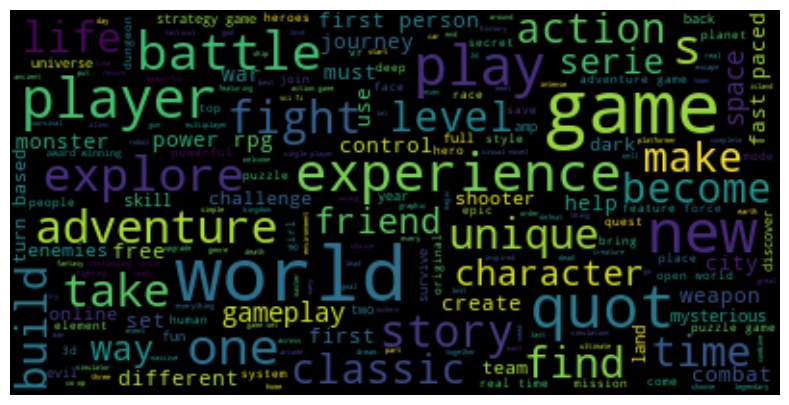

In [9]:
fig, ax = plt.subplots(figsize =(15,5))

wordcloud_from_column(data,'short_description',ignore=stopwords.words('english'), ax=ax)

plt.show()

### Clustering

#### TSNE

In [59]:
def custom_features(dataframe_in):
    df = dataframe_in.copy(deep=True)

    df['month'] = pd.to_datetime(data['release_date']).dt.month
    df['release_date'] = pd.to_datetime(data['release_date']).apply(lambda x: x.to_julian_date())
    df['revenue'] = 0

    top_pub_revenues = {'microsoft':10.260, 'netease':6.668, 'activision':6.388, 'electronic':5.537, 'bandai':3.018, 'square':2.386, 'nexon':2.286,
                        'ubisoft':1.446, 'konami':1.303, 'SEGA':1.153, 'capcom':0.7673, 'warner':0.7324}

    for rev_tuples in top_pub_revenues.items():
        pub, rev = rev_tuples
        if pub == 'SEGA':
            df.loc[data.publisher.str.match(f'.*{pub}.*').values, 'revenue'] = rev
        else:
            df.loc[data.publisher.str.match(f'.*{pub}.*', flags=re.IGNORECASE).values, 'revenue'] = rev    
    return df

In [77]:
np.random.seed(102)

col_transformer = ColumnTransformer(
    transformers=[
        ('MinMaxScaler',MinMaxScaler(),['required_age','price', 'estimated_sells', 'release_date']),
        ('BoxCox',PowerTransformer(method='yeo-johnson'),['achievements','average_playtime']),
])

tsne_pipeline = Pipeline([
    # aplicar transformaciones para custom features
    ('Features',FunctionTransformer(custom_features)),
    ('FeatureScaler',col_transformer),
    ('TSNE',TSNE())
])

In [78]:
%%capture
X_tsne = tsne_pipeline.fit_transform(data[['release_date','english','required_age','achievements','average_playtime', 'price', 'estimated_sells']])

In [79]:
fig = px.scatter(
    data, x=X_tsne[:,0], y=X_tsne[:,1], color='rating', title='Visualización de atributos con t-SNE',
    hover_name='name', hover_data=['release_date','english','required_age','achievements','average_playtime', 'price', 'estimated_sells']
)

fig.show()

#### KMEANS

##### Método del codo

In [80]:
inertias = []
cachedir = mkdtemp()
for n in range(1,21):
    kmeans_elbow_pipeline = Pipeline([
        # aplicar transformaciones para custom features
        ('Features',FunctionTransformer(custom_features)),
        ('FeatureScaler',col_transformer),
        ('KMEANS',KMeans(n_clusters=n))
    ],
    memory=cachedir)
    kmeans_elbow_pipeline.fit_transform(data[['release_date','english','required_age','achievements','average_playtime', 'price', 'estimated_sells']])
    inertias.append([n, kmeans_elbow_pipeline.named_steps['KMEANS'].inertia_])

inertias = pd.DataFrame(inertias, columns=["n° clusters", "inertia"])

In [83]:
inertias['norm'] = (inertias['inertia'] - inertias['inertia'].mean()) / inertias['inertia'].std()

In [104]:
fig = px.line(
    inertias,
    x="n° clusters",
    y="inertia",
    title="Método del Codo con K-Means",
    text='n° clusters',
    height=600,
    markers=True
)
fig.add_vline(x=4, line_dash="dash", line_color="red")

fig.update_traces(textposition="bottom right")

##### Entrenamiento con mejor núnero de clústers

In [113]:
n_clusters = 4

kmeans_pipeline = Pipeline([
        # aplicar transformaciones para custom features
        ('Features',FunctionTransformer(custom_features)),
        ('FeatureScaler',col_transformer),
        ('KMEANS',KMeans(n_clusters=n_clusters)) # Falta elegir el n óptimo
    ])

X_kmeans = kmeans_pipeline.fit_transform(data[['name', 'release_date','english','required_age','achievements','average_playtime', 'price', 'estimated_sells']])

##### Visualización de resultados

In [114]:
df_kmeans = kmeans_pipeline.named_steps['Features'].transform(data[['name','release_date','english','required_age','achievements','average_playtime', 'price', 'estimated_sells']])
df_kmeans['labels'] = kmeans_pipeline.named_steps['KMEANS'].labels_.astype(str)

summary_table = pd.concat(
    [
        df_kmeans.groupby('labels').mean(numeric_only=True).round(1),
        df_kmeans.groupby('labels').agg(count=('name','count'))
    ],
    axis=1)

In [129]:
# summary_table
import dataframe_image as dfi
dfi.export(summary_table, 'tabla_cluster.png')

[1214/133711.557833:ERROR:bus.cc(398)] Failed to connect to the bus: Failed to connect to socket /var/run/dbus/system_bus_socket: No such file or directory
[1214/133711.558783:ERROR:bus.cc(398)] Failed to connect to the bus: Failed to connect to socket /var/run/dbus/system_bus_socket: No such file or directory
[1214/133711.612400:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1214/133922.400090:ERROR:angle_platform_impl.cc(43)] DisplayVkXcb.cpp:59 (initialize): xcb_connect() failed, error 1
[1214/133922.400384:ERROR:angle_platform_impl.cc(43)] Display.cpp:1006 (initialize): ANGLE Display::initialize error 12289: Not initialized.
[1214/133922.401637:ERROR:gl_surface_egl.cc(822)] EGL Driver message (Critical) eglInitialize: Not initialized.
[1214/133922.401777:ERROR:gl_surface_egl.cc(1352)] eglInitialize SwANGLE failed with error EGL_NOT_INITIALIZED
[1214/133922.402384:ERROR:gl_ozone_egl.cc(21)] GLSurfaceEGL::InitializeOneOff failed.
[121

In [116]:
labels = kmeans_pipeline.named_steps['KMEANS'].labels_.astype(str)

fig = px.scatter(
    data, x=X_tsne[:,0], y=X_tsne[:,1], color=labels, title='Visualización de atributos con t-SNE clasificados por clúster',
    hover_name='name', hover_data=['release_date','english','required_age','achievements','average_playtime', 'price', 'estimated_sells']
)
fig.update_layout(legend_title_text='Clúster')
fig.show()



Al efectuar el análisis exploratorio de datos pudimos notar lo siguiente:

El atributo A tenía X datos nulos y Y duplicados... que podrían potencialmente dificultar el análisis.

La variable A se distribuye de forma normal. En cambio la B en forma exponencial. La variable C es categórica.

Los atributos A y B interactúan de P forma, mientras que los C y D de Q forma...

Los atributos A y C se correlacionan con las variables de salida Y de forma creciente... B no tiene correlación con la salida.

Además, encontramos que al proyectar en 2D ...

...